In [1]:
%pylab inline

import os
import pandas as pd
import seaborn as sns
import folium
from folium.plugins import FastMarkerCluster, HeatMap, HeatMapWithTime


sns.set_style('whitegrid')
sns.set_palette('colorblind')

Populating the interactive namespace from numpy and matplotlib


In [2]:
files = os.listdir('../data/raw/060718/')
# files.remove('.gitkeep')

In [3]:
df = pd.DataFrame()
for f in files:
    df = df.append(pd.read_json(f'../data/raw/060718/{f}'))

In [4]:
df['region'] = [x[-1] for x in df.location.str.split(', ').tolist()]
df['province'] = [x[-2] for x in df.location.str.split(', ').tolist()]

In [5]:
df.describe()

,crimetype,lat,lng
count,189423.000000,189423.000000,189423.000000
mean,215.578235,12.699505,122.188128
std,322.316883,2.972481,1.650593
min,2.000000,4.659060,52.208900
25%,8.000000,10.315200,120.990000
50%,123.000000,14.313600,121.108000
75%,123.000000,14.628600,123.665500
max,916.000000,90.000000,165.755000


In [6]:
df.date = pd.to_datetime(df.date)

In [7]:
df['hour'] = pd.to_datetime(df['time'], format='%H:%M:%S').dt.hour

# Crime Types and Modus Plots

### Unsurprisingly, NCR has the most number of reported crimes, followed by Region IV-A. This is positively correlated with the population distribution. 

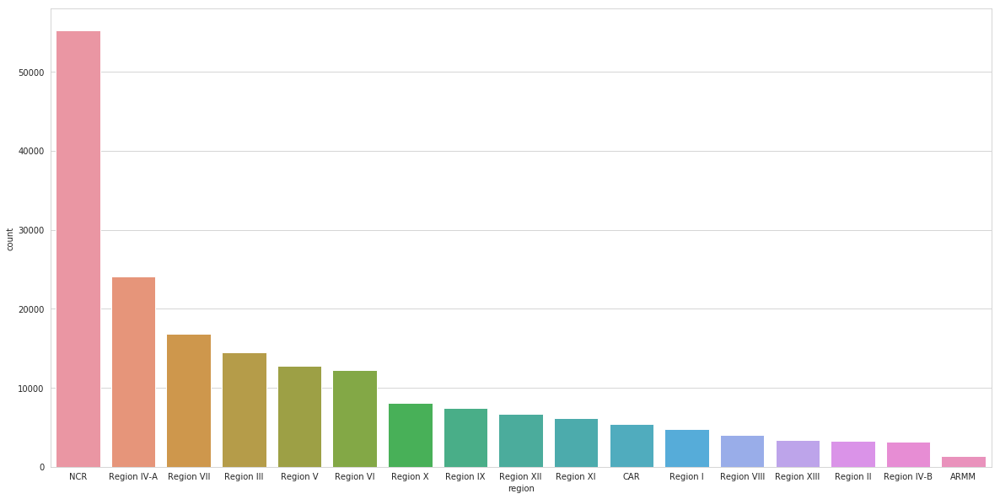

In [8]:
figsize(20, 10)
sns.countplot(x='region', data=df, order = df['region'].value_counts().index)

### Drilling down, NCR Eastern has the most reported crimes, followed by Quezon City and Cavite.

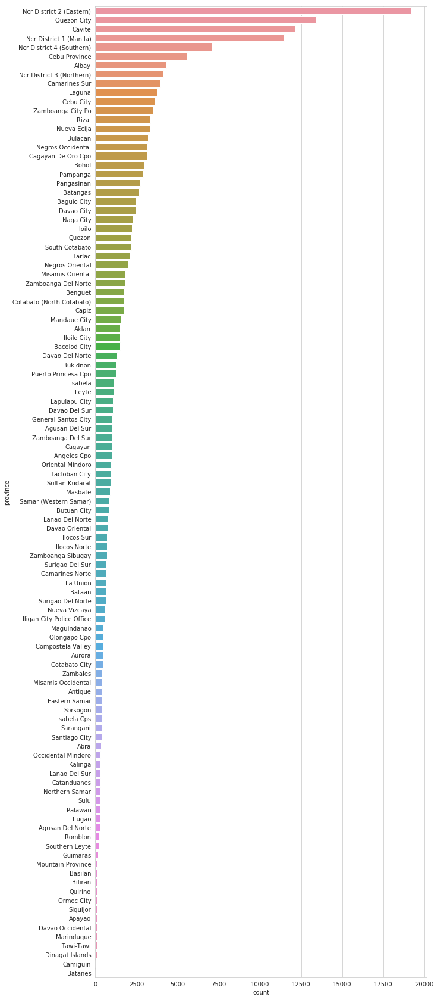

In [9]:
figsize(10, 30)
sns.countplot(y='province', data=df, order = df['province'].value_counts().index)

### Vehicular accidents top the list of crimes, followed by drug incidents and theft. Motorcycles are stolen more than cars.

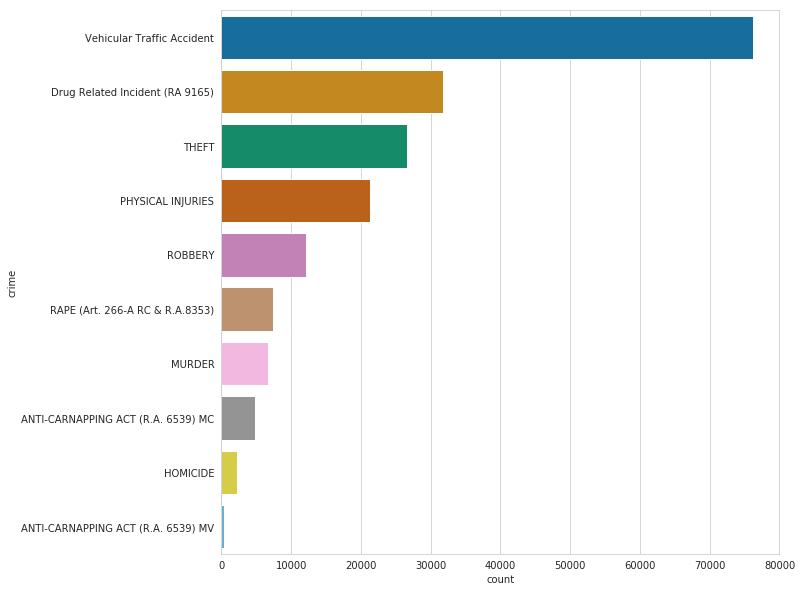

In [10]:
figsize(10, 10)
sns.countplot(y='crime', data=df, order = df['crime'].value_counts().index)

### However, modus is mostly not indicated.

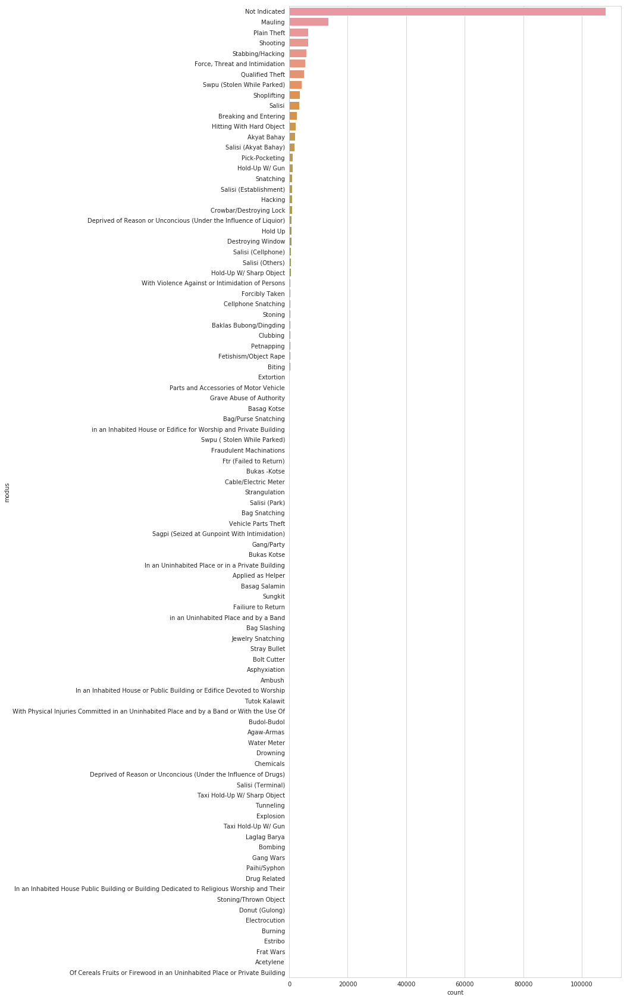

In [11]:
figsize(10, 30)
sns.countplot(y='modus', data=df, order = df['modus'].value_counts().index)

### Deeper inspection shows that the missing modus is on drug-related crimes and vehicular accidents. 

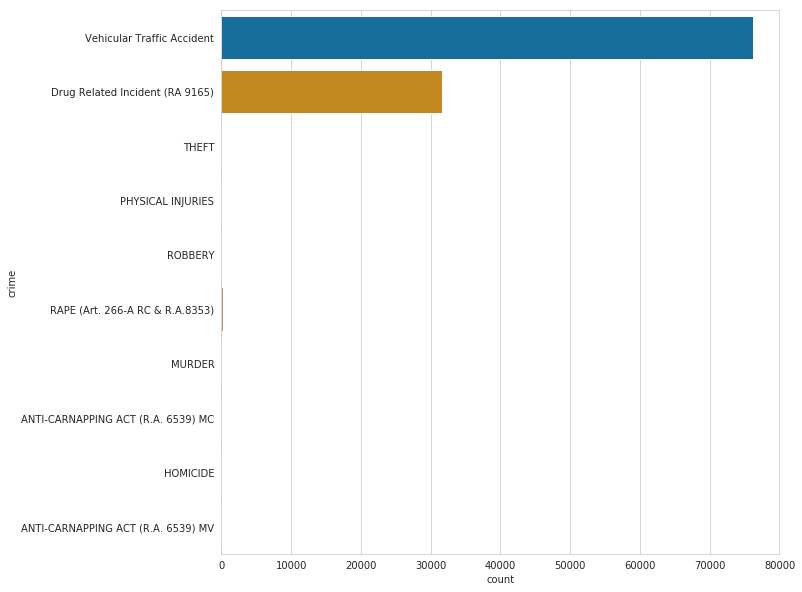

In [12]:
figsize(10, 10)
sns.countplot(y='crime', data=df[df.modus == 'Not Indicated'], order = df['crime'].value_counts().index)

## Temporal Crime Analysis

### The data spans from

In [13]:
str(df.date.min())

'2017-08-03 00:00:00'

### to

In [14]:
str(df.date.max())

'2018-07-10 00:00:00'

### There seems to be a sudden decrease of crimes reported. This needs further analysis.

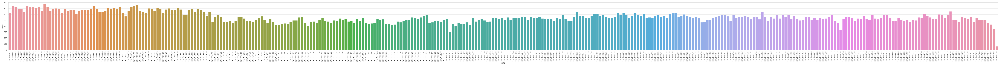

In [15]:
figsize(100, 5)
g = sns.countplot(x=df.date.dt.date)
x = g.set_xticklabels(g.get_xticklabels(), rotation=90)

### The crime incidence distribution dependent on the day of the week is uniform.

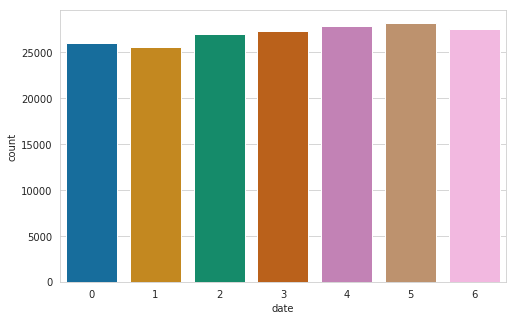

In [16]:
figsize(8, 5)
sns.countplot(x=df.date.dt.dayofweek)

### Majority of the crimes happen during the evening

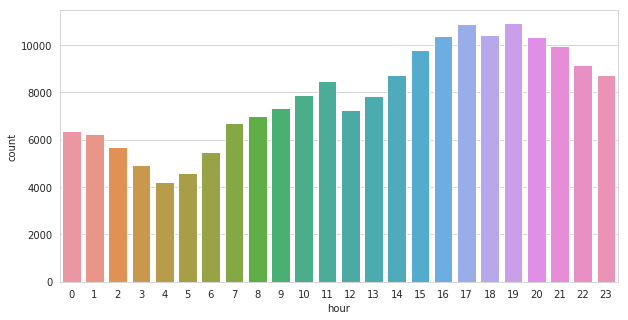

In [17]:
figsize(10, 5)
sns.countplot(x='hour', data=df)

### Factoring out Vehicular Accidents, the time incidence distribution is still a bit similar but higher during the evenings.

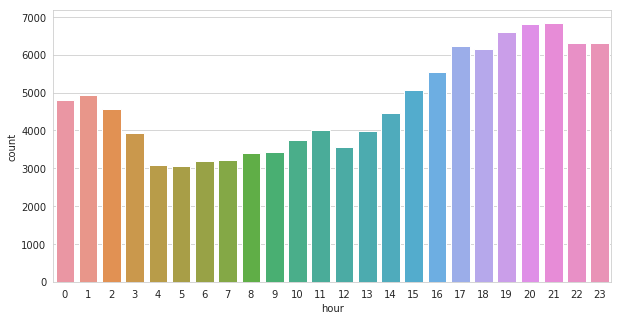

In [18]:
figsize(10, 5)
sns.countplot(x='hour', data=df[df.crime != 'Vehicular Traffic Accident'])

### Traffic Accidents peak during rush hour periods, from 7AM - 9 PM

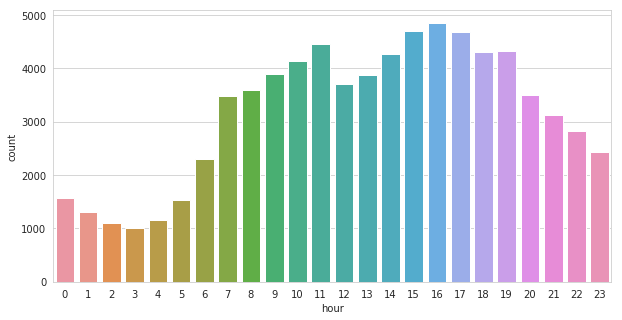

In [19]:
figsize(10, 5)
sns.countplot(x='hour', data=df[df.crime == 'Vehicular Traffic Accident'])

### Murder and Homicide is mostly occur in the early hours of the night

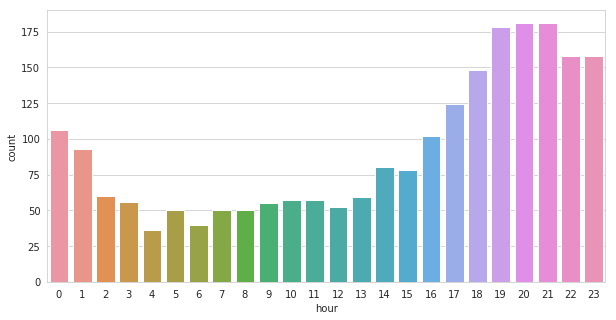

In [20]:
figsize(10, 5)
sns.countplot(x='hour', data=df[df.crime == 'HOMICIDE'])

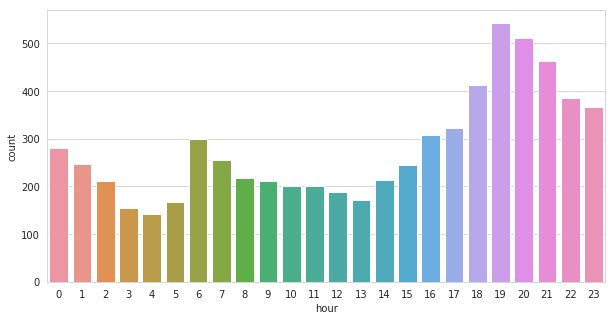

In [21]:
figsize(10, 5)
sns.countplot(x='hour', data=df[df.crime == 'MURDER'])

### Theft looks like it's a day job, even with lunch hours?

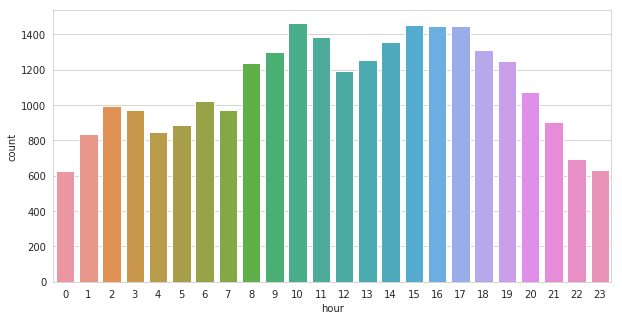

In [22]:
figsize(10, 5)
sns.countplot(x='hour', data=df[df.crime == 'THEFT'])

### Drug-related Incidents occur in the latter half of the day.

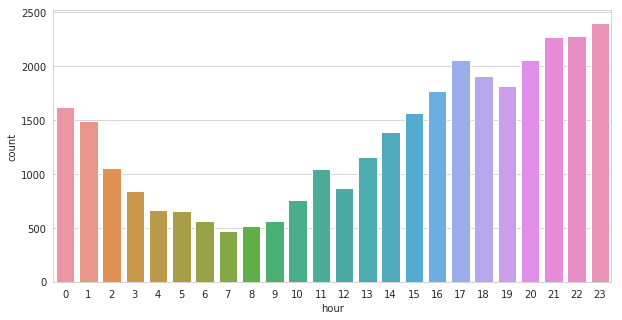

In [23]:
figsize(10, 5)
sns.countplot(x='hour', data=df[df.crime == 'Drug Related Incident (RA 9165)'])

### Rape incidences mostly occur in the afternoon and late at night.

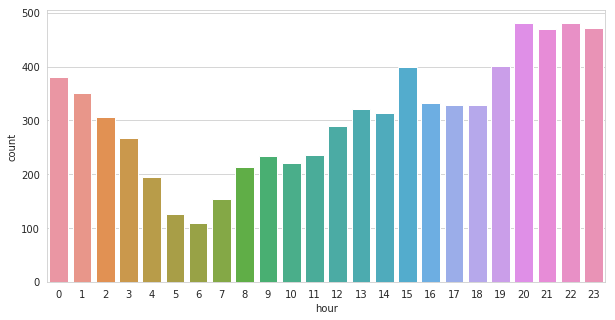

In [24]:
figsize(10, 5)
sns.countplot(x='hour', data=df[df.crime == 'RAPE (Art. 266-A RC & R.A.8353)'])

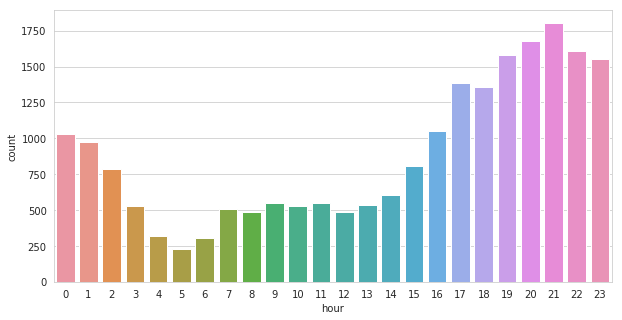

In [25]:
figsize(10, 5)
sns.countplot(x='hour', data=df[df.crime == 'PHYSICAL INJURIES'])

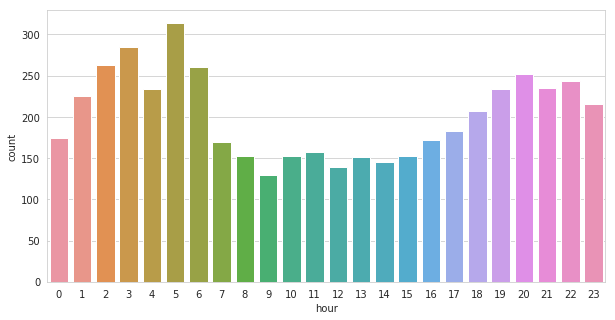

In [26]:
figsize(10, 5)
sns.countplot(x='hour', data=df[df.crime == 'ANTI-CARNAPPING ACT (R.A. 6539) MC'])

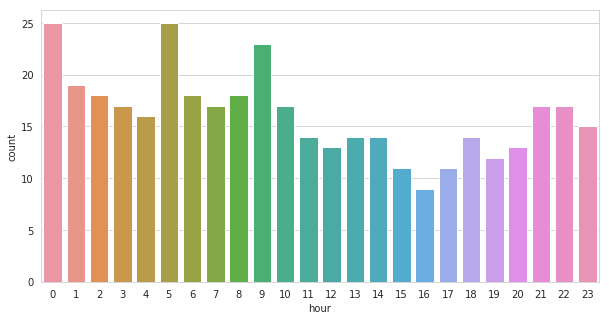

In [27]:
figsize(10, 5)
sns.countplot(x='hour', data=df[df.crime == 'ANTI-CARNAPPING ACT (R.A. 6539) MV'])

## Spatial Crime Clustering Analysis

### Vehicular Accidents

In [28]:
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = FastMarkerCluster(df[df.crime == 'Vehicular Traffic Accident'][['lat', 'lng']].values.tolist()).add_to(m)
m

### Homicide

In [29]:
m = folium.Map(location=[13.5, 122.4], zoom_start=6)

marker_cluster = FastMarkerCluster(df[df.crime == 'HOMICIDE'][['lat', 'lng']].values.tolist()).add_to(m)
m

### Murder

In [30]:
m = folium.Map(location=[13.5, 122.4], zoom_start=6)

marker_cluster = FastMarkerCluster(df[df.crime == 'MURDER'][['lat', 'lng']].values.tolist()).add_to(m)
m

### Theft

In [31]:
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = FastMarkerCluster(df[df.crime == 'THEFT'][['lat', 'lng']].values.tolist()).add_to(m)
m

### Robbery

In [32]:
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = FastMarkerCluster(df[df.crime == 'ROBBERY'][['lat', 'lng']].values.tolist()).add_to(m)
m

### Drug-related Incidents

In [33]:
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = FastMarkerCluster(df[df.crime == 'Drug Related Incident (RA 9165)'][['lat', 'lng']].values.tolist()).add_to(m)
m

### Rape

In [34]:
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = FastMarkerCluster(df[df.crime == 'RAPE (Art. 266-A RC & R.A.8353)'][['lat', 'lng']].values.tolist()).add_to(m)
m

### Physical Injuries

In [35]:
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = FastMarkerCluster(df[df.crime == 'PHYSICAL INJURIES'][['lat', 'lng']].values.tolist()).add_to(m)
m

## Spatiotemporal Heatmaps

In [36]:
def to_spacetime(crime_type):
    grouped = df[df.crime == crime_type].groupby('date')[['lat', 'lng']]
    data = []
    for i in grouped.last().index:
        data.append(grouped.get_group(i).values.tolist())
    return (grouped, data)

### Vehicular Accidents

In [37]:
grouped, data = to_spacetime('Vehicular Traffic Accident')
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = HeatMapWithTime(data, index=[str(a.date()) for a in grouped.last().index]).add_to(m)
m

### Homicide

In [38]:
grouped, data = to_spacetime('HOMICIDE')
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = HeatMapWithTime(data, index=[str(a.date()) for a in grouped.last().index]).add_to(m)
m

### Murder

In [39]:
grouped, data = to_spacetime('MURDER')
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = HeatMapWithTime(data, index=[str(a.date()) for a in grouped.last().index]).add_to(m)
m

### Theft

In [40]:
grouped, data = to_spacetime('THEFT')
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = HeatMapWithTime(data, index=[str(a.date()) for a in grouped.last().index]).add_to(m)
m

### Robbery

In [41]:
grouped, data = to_spacetime('ROBBERY')
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = HeatMapWithTime(data, index=[str(a.date()) for a in grouped.last().index]).add_to(m)
m

### Drug Related Incidents

In [42]:
grouped, data = to_spacetime('Drug Related Incident (RA 9165)')
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = HeatMapWithTime(data, index=[str(a.date()) for a in grouped.last().index]).add_to(m)
m

### Rape

In [43]:
grouped, data = to_spacetime('RAPE (Art. 266-A RC & R.A.8353)')
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = HeatMapWithTime(data, index=[str(a.date()) for a in grouped.last().index]).add_to(m)
m

### Physical Injuries

In [44]:
grouped, data = to_spacetime('PHYSICAL INJURIES')
m = folium.Map(location=[13.5, 122.4], zoom_start=6)
marker_cluster = HeatMapWithTime(data, index=[str(a.date()) for a in grouped.last().index]).add_to(m)
m

## Follow-up Questions:

1. Is there an artificial decrease of crime incidences over time?
2. Where are the major crime hotspots in Metro Manila?
   - Possibly using Voronoi or other clustering methods
2. Does crime incidences follow a pattern like that of earthquakes and aftershocks in the PH, similar to PredPol's hypothesis? 
3. What other datasets can we use for prediction?
   - Environment data, maybe from Project NOAH
   - Rasterized image maps from OpenStreetMaps
   - Demographics
   - Social Determinants of Health